**Importing Python Libraries**

In [ ]:
import kagglehub
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import seaborn as sns
import os
import shutil
import glob
import cv2
from PIL import Image
import os
import shutil

**Moving the uncorrupted file to new folder**

some of the images in this are corrupted below is this function to move uncorrupted file to new location

In [ ]:
output = "/kaggle/working/comprehensive-soil-classification-datasets/Orignal-Dataset/Yellow_Soil"
folder = "/kaggle/input/comprehensive-soil-classification-datasets/CyAUG-Dataset/Yellow_Soil"

os.makedirs(output, exist_ok=True)
for count, filename in enumerate(os.listdir(folder)):
    src = f"{folder}/{filename}"
    dst = f"{output}/Yellow_Soil_{str(count)}.jpg"
    shutil.copy2(src, dst)

Sample images

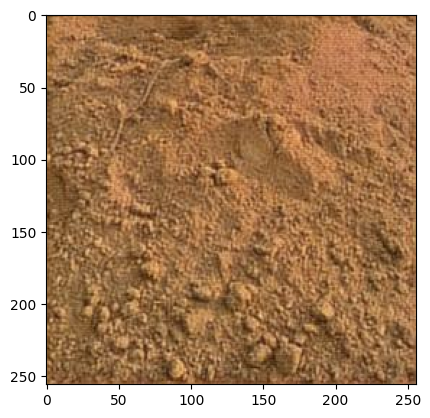

In [12]:
from PIL import Image
import matplotlib.image as mpimg
import cv2
img = mpimg.imread(r'/kaggle/working/comprehensive-soil-classification-datasets/Orignal-Dataset/Alluvial_Soil/Alluvial_Soil_0.jpg')
imgplot = plt.imshow(img)
plt.show()

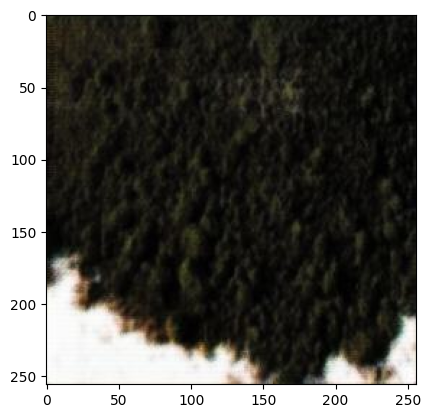

In [13]:
img = mpimg.imread(r'/kaggle/working/comprehensive-soil-classification-datasets/Orignal-Dataset/Black_Soil/Black_Soil_0.jpg')
imgplot = plt.imshow(img)
plt.show()

Folder Name inside the dataset, which then act as class

In [14]:
filenames = os.listdir('/kaggle/working/comprehensive-soil-classification-datasets/Orignal-Dataset')

In [15]:
print(filenames)

['Laterite_Soil', 'Alluvial_Soil', 'Yellow_Soil', 'Mountain_Soil', 'Arid_Soil', 'Red_Soil', 'Black_Soil']


In [16]:
base="/kaggle/working/comprehensive-soil-classification-datasets/Orignal-Dataset/"
alluvial=[]
arid=[]
black=[]
laterite=[]
mountain=[]
red=[]
yellow=[]
for files in filenames:
  if files=='Alluvial_Soil':
    alluvial = [f for f in os.listdir(os.path.join(base, files))]
  elif files=='Arid_Soil':
    arid = [f for f in os.listdir(os.path.join(base, files))]
  elif files=='Black_Soil':
    black = [f for f in os.listdir(os.path.join(base, files))]
  elif files=='Laterite_Soil':
    laterite = [f for f in os.listdir(os.path.join(base, files))]
  elif files=='Mountain_Soil':
    mountain = [f for f in os.listdir(os.path.join(base, files))]
  elif files=='Red_Soil':
    red = [f for f in os.listdir(os.path.join(base, files))]
  elif files=='Yellow_Soil':
    yellow = [f for f in os.listdir(os.path.join(base, files))]

print("#####################")
print(len(alluvial),len(arid),len(black),len(laterite),len(mountain),len(red),len(yellow))
print("total=",len(alluvial)+len(arid)+len(black)+len(laterite)+len(mountain)+len(red)+len(yellow))
print("#################")
print(alluvial[0:5])
print("################")
print(arid[0:5])
print("################")
print(black[0:5])
print("################")
print(laterite[0:5])
print("################")
print(mountain[0:5])
print("################")
print(red[0:5])
print("################")
print(yellow[0:5])
print("################")

#####################
693 284 1173 219 201 1126 1401
total= 5097
#################
['Alluvial_Soil_335.jpg', 'Alluvial_Soil_261.jpg', 'Alluvial_Soil_83.jpg', 'Alluvial_Soil_23.jpg', 'Alluvial_Soil_591.jpg']
################
['Arid_Soil_103.jpg', 'Arid_Soil_77.jpg', 'Arid_Soil_115.jpg', 'Arid_Soil_2.jpg', 'Arid_Soil_155.jpg']
################
['Black_Soil_714.jpg', 'Black_Soil_821.jpg', 'Black_Soil_490.jpg', 'Black_Soil_1161.jpg', 'Black_Soil_25.jpg']
################
['Laterite_Soil_173.jpg', 'Laterite_Soil_42.jpg', 'Laterite_Soil_11.jpg', 'Laterite_Soil_168.jpg', 'Laterite_Soil_72.jpg']
################
['Mountain_Soil_138.jpg', 'Mountain_Soil_56.jpg', 'Mountain_Soil_137.jpg', 'Mountain_Soil_78.jpg', 'Mountain_Soil_10.jpg']
################
['Red_Soil_47.jpg', 'Red_Soil_156.jpg', 'Red_Soil_581.jpg', 'Red_Soil_1042.jpg', 'Red_Soil_909.jpg']
################
['Yellow_Soil_414.jpg', 'Yellow_Soil_1267.jpg', 'Yellow_Soil_611.jpg', 'Yellow_Soil_302.jpg', 'Yellow_Soil_1327.jpg']
############

In [17]:
original_path = '/kaggle/working/comprehensive-soil-classification-datasets/Orignal-Dataset'
new_path = '/kaggle/working/images_resized_improved/'

if not os.path.exists(new_path):
    os.makedirs(new_path)

Preprocessing images

In [18]:
print("Preprocessing images...")
soil_folders = os.listdir(original_path)
for folder in soil_folders:
    folder_path = os.path.join(original_path, folder)
    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")
        output_subfolder = os.path.join(new_path, folder)
        if not os.path.exists(output_subfolder):
            os.makedirs(output_subfolder)
        
        for file in os.listdir(folder_path):
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                src_path = os.path.join(folder_path, file)
                try:
                    img = Image.open(src_path)
                    img = img.convert('RGB')
                    img = img.resize((224, 224), Image.LANCZOS)
                    target_path = os.path.join(output_subfolder, file)
                    img.save(target_path, "JPEG", quality=95)
                except Exception as e:
                    print(f"Error processing {file}: {e}")

print("Image preprocessing complete!")

Preprocessing images...
Processing folder: Laterite_Soil
Processing folder: Alluvial_Soil
Processing folder: Yellow_Soil
Processing folder: Mountain_Soil
Processing folder: Arid_Soil
Processing folder: Red_Soil
Processing folder: Black_Soil
Image preprocessing complete!


In [29]:
image_directory = '/kaggle/working/images_resized_improved/'
image_extensions = ['png', 'jpg', 'jpeg']
files = []
[files.extend(glob.glob(image_directory + '**/*.' + e, recursive=True)) for e in image_extensions]

soil_images = []
labels = []

In [30]:
for file in files:
    try:
        img = cv2.imread(file)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            soil_images.append(img)
            
            # Extract label from path
            folder_name = os.path.basename(os.path.dirname(file))
            if folder_name.startswith('Alluvial'):
                labels.append(0)
            elif folder_name.startswith('Laterite'):
                labels.append(1)
            elif folder_name.startswith('Black'):
                labels.append(2)
            elif folder_name.startswith('Yellow'):
                labels.append(3)
            elif folder_name.startswith('Arid'):
                labels.append(4)
            elif folder_name.startswith('Mountain'):
                labels.append(5)
            elif folder_name.startswith('Red'):
                labels.append(6)
    except Exception as e:
        print(f"Error loading {file}: {e}")

In [31]:
X = np.asarray(soil_images)
Y = np.asarray(labels)

print(f"Total images loaded: {len(X)}")
print(f"Class distribution: {np.bincount(Y)}")

Total images loaded: 5097
Class distribution: [ 693  219 1173 1401  284  201 1126]


Train test Split of the uncorrupted dataset

- Training set: 3261
- Validation set: 816
- Test set: 1020

In [32]:
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.2, shuffle=True, random_state=42, stratify=Y
)
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train, Y_train, test_size=0.2, shuffle=True, random_state=42, stratify=Y_train
)

print(f"Training set: {len(X_train)}")
print(f"Validation set: {len(X_val)}")
print(f"Test set: {len(X_test)}")

Training set: 3261
Validation set: 816
Test set: 1020


Model building 

Augmentation of dataset's images 

In [ ]:
def create_model():
    inputs = layers.Input(shape=(224, 224, 3))
    x = layers.RandomFlip("horizontal_and_vertical")(inputs)
    x = layers.RandomRotation(0.3)(x)
    x = layers.RandomZoom(0.2)(x)
    x = layers.RandomContrast(0.2)(x)
    x = layers.RandomBrightness(0.2)(x)
    x = tf.keras.applications.efficientnet.preprocess_input(x)

    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_tensor=x
    )
    base_model.trainable = True
    for layer in base_model.layers[:-20]:
        layer.trainable = False
    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(7, activation='softmax')(x)
    
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

model = create_model()
model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_flip_1       │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (RandomFlip)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_rotation_1   │ (None, 224, 224,  │          0 │ random_flip_1[0]… │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_zoom_1       │ (None, 224, 224,  │          0 │ random_rotation_… │
│ (RandomZoom)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast_1   │ (None, 224, 224,  │          0 │ random_zoom_1[0]… │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_brightness_1 │ (None, 224, 224,  │          0 │ random_contrast_… │
│ (RandomBrightness)  │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ random_brightnes… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 224, 224,  │          7 │ rescaling_2[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ normalization_1[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_3[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati

 Total params: 4,846,762 (18.49 MB)

 Trainable params: 2,144,055 (8.18 MB)

 Non-trainable params: 2,702,707 (10.31 MB)

In [35]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [36]:
callbacks = [
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    ),
    EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    )
]

Model training with train , test , val

In [37]:
history = model.fit(
    X_train, Y_train,
    validation_data=(X_val, Y_val),
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/100


E0000 00:00:1763550563.078488      48 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_1/block2b_drop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1763550566.609736     170 cuda_dnn.cc:529] Loaded cuDNN version 90300


102/102 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - accuracy: 0.6347 - loss: 2.2321 - val_accuracy: 0.8713 - val_loss: 1.4798 - learning_rate: 0.0010
Epoch 2/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8999 - loss: 1.3827 - val_accuracy: 0.9412 - val_loss: 1.2257 - learning_rate: 0.0010
Epoch 3/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - accuracy: 0.9398 - loss: 1.2294 - val_accuracy: 0.9412 - val_loss: 1.2045 - learning_rate: 0.0010
Epoch 4/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - accuracy: 0.9361 - loss: 1.1524 - val_accuracy: 0.9485 - val_loss: 1.1104 - learning_rate: 0.0010
Epoch 5/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step - accuracy: 0.9393 - loss: 1.0953 - val_accuracy: 0.9350 - val_loss: 1.0838 - learning_rate: 0.0010
Epoch 6/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - accuracy: 0.9498 - loss: 0.9837 - val_accuracy: 0.9350 - val_loss: 1.0570 - learning_rate: 0.0010
Epoch 7/100
102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - accuracy: 0.9427 -

Visualization of model output

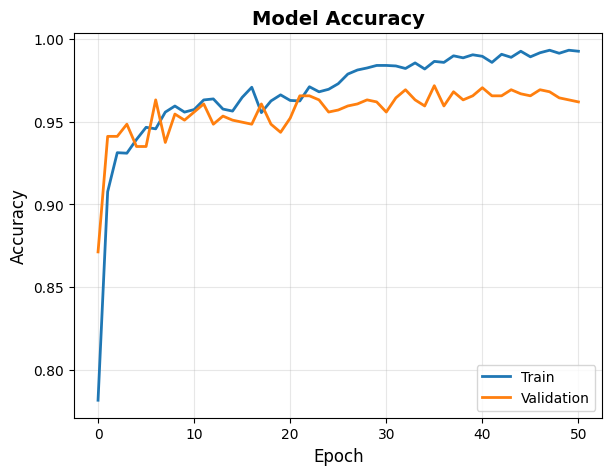

In [38]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], linewidth=2, label='Train')
plt.plot(history.history['val_accuracy'], linewidth=2, label='Validation')
plt.title('Model Accuracy', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12)
plt.xlabel('Epoch', fontsize=12)
plt.legend(loc='lower right')
plt.grid(True, alpha=0.3)

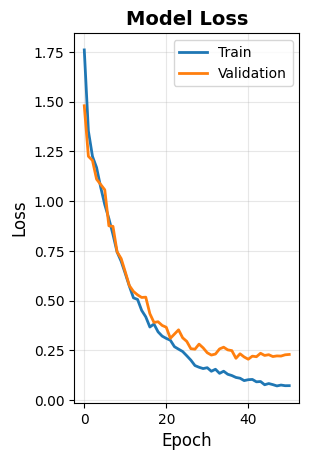

In [ ]:
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], linewidth=2, label='Train')
plt.plot(history.history['val_loss'], linewidth=2, label='Validation')
plt.title('Model Loss', fontsize=14, fontweight='bold')
plt.ylabel('Loss', fontsize=12)
plt.xlabel('Epoch', fontsize=12)
plt.legend(loc='upper right')
plt.grid(True, alpha=0.3)

Model Testing on test dataset

In [42]:
test_loss, test_acc = model.evaluate(X_test, Y_test, verbose=1)
print(f"\n{'='*50}")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f} ({test_acc*100:.2f}%)")
print(f"{'='*50}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.9661 - loss: 0.1742

Test Loss: 0.1983
Test Accuracy: 0.9667 (96.67%)


In [43]:
Y_pred = model.predict(X_test)
Y_pred_classes = np.argmax(Y_pred, axis=1)

32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step


Classification Report:
              precision    recall  f1-score   support

    Alluvial       0.94      0.96      0.95       139
    Laterite       0.91      0.91      0.91        44
       Black       1.00      0.99      0.99       235
      Yellow       1.00      0.98      0.99       280
        Arid       0.84      0.81      0.82        57
    Mountain       0.77      0.90      0.83        40
         Red       1.00      0.99      0.99       225

    accuracy                           0.97      1020
   macro avg       0.92      0.93      0.93      1020
weighted avg       0.97      0.97      0.97      1020

In [44]:
class_names = ['Alluvial', 'Laterite', 'Black', 'Yellow', 'Arid', 'Mountain', 'Red']
print("\nClassification Report:")
print(classification_report(Y_test, Y_pred_classes, target_names=class_names))


Classification Report:
              precision    recall  f1-score   support

    Alluvial       0.94      0.96      0.95       139
    Laterite       0.91      0.91      0.91        44
       Black       1.00      0.99      0.99       235
      Yellow       1.00      0.98      0.99       280
        Arid       0.84      0.81      0.82        57
    Mountain       0.77      0.90      0.83        40
         Red       1.00      0.99      0.99       225

    accuracy                           0.97      1020
   macro avg       0.92      0.93      0.93      1020
weighted avg       0.97      0.97      0.97      1020



Confusion matrix

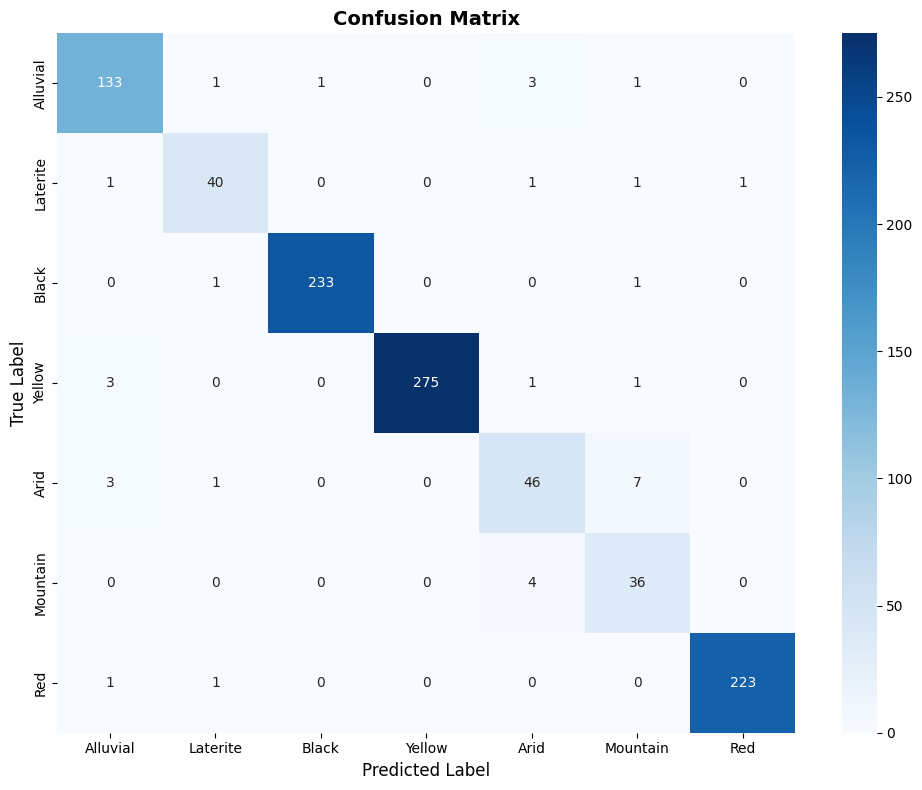

In [45]:
cm = confusion_matrix(Y_test, Y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.show()

model saving

In [46]:
model.save('final1_soil_classification_model.keras')

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import tensorflow as tf
from tensorflow import keras
import os

In [48]:
model = keras.models.load_model('/kaggle/working/final1_soil_classification_model.keras')
print("Model loaded successfully!")

Model loaded successfully!


In [49]:
class_names = ['Alluvial', 'Laterite', 'Black', 'Yellow', 'Arid', 'Mountain', 'Red']

In [ ]:
def predict_soil_from_path(image_path, model, class_names, show_image=True):
    try:
        img = Image.open(image_path)
        img = img.convert('RGB')
        img = img.resize((224, 224))
        img_array = np.array(img)
        img_array = np.expand_dims(img_array, axis=0)
        predictions = model.predict(img_array, verbose=0)
        predicted_class_idx = np.argmax(predictions[0])
        confidence = predictions[0][predicted_class_idx] * 100
        predicted_class = class_names[predicted_class_idx]
        if show_image:
            plt.figure(figsize=(12, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence:.2f}%', 
                     fontsize=14, fontweight='bold', color='green' if confidence > 70 else 'orange')

            plt.subplot(1, 2, 2)
            probabilities = predictions[0] * 100
            colors = ['green' if i == predicted_class_idx else 'skyblue' for i in range(len(class_names))]
            bars = plt.barh(class_names, probabilities, color=colors)
            plt.xlabel('Confidence (%)', fontsize=12)
            plt.title('Prediction Confidence for All Classes', fontsize=12, fontweight='bold')
            plt.xlim(0, 100)
            
            for i, (bar, prob) in enumerate(zip(bars, probabilities)):
                plt.text(prob + 1, i, f'{prob:.1f}%', va='center', fontsize=10)
            
            plt.tight_layout()
            plt.show()
        print(f"Predicted Soil Type: {predicted_class}")
        print(f"Confidence: {confidence:.2f}%")
        print(f"{'='*60}")
        print("\nAll Class Probabilities:")
        for name, prob in zip(class_names, predictions[0] * 100):
            print(f"  {name:12s}: {prob:6.2f}%")
        print(f"{'='*60}\n")
        
        return predicted_class, confidence, predictions[0]
    
    except Exception as e:
        print(f"Error predicting image: {e}")
        return None, None, None

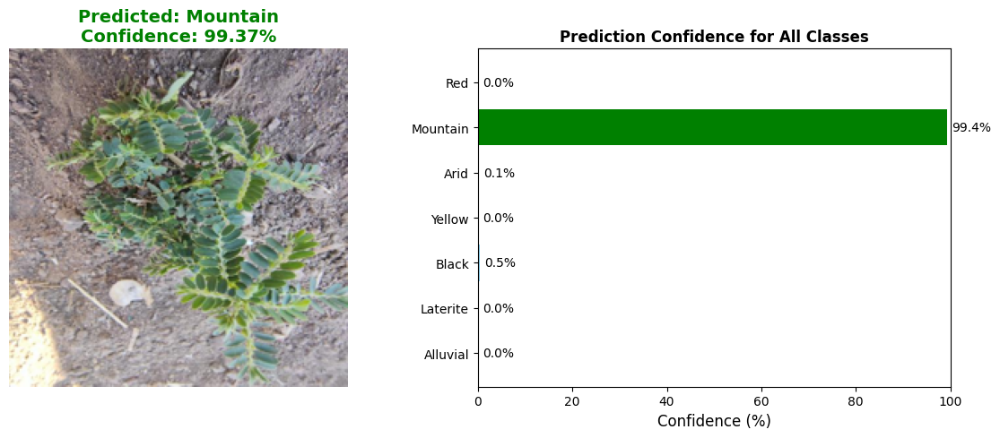


Predicted Soil Type: Mountain
Confidence: 99.37%

All Class Probabilities:
  Alluvial    :   0.00%
  Laterite    :   0.02%
  Black       :   0.49%
  Yellow      :   0.00%
  Arid        :   0.12%
  Mountain    :  99.37%
  Red         :   0.00%



In [51]:
predicted_class, confidence, probs = predict_soil_from_path(
    '/kaggle/input/image-dataset/weed_1.jpeg', 
    model, 
    class_names
)

In [ ]:
def predict_multiple_images(image_paths, model, class_names):
    num_images = len(image_paths)
    cols = 4
    rows = (num_images + cols - 1) // cols
    
    plt.figure(figsize=(16, 4 * rows))
    
    for idx, img_path in enumerate(image_paths):
        try:
            img = Image.open(img_path)
            img = img.convert('RGB')
            img_resized = img.resize((224, 224))
            img_array = np.array(img_resized)
            img_array = np.expand_dims(img_array, axis=0)
            predictions = model.predict(img_array, verbose=0)
            predicted_idx = np.argmax(predictions[0])
            confidence = predictions[0][predicted_idx] * 100
            predicted_class = class_names[predicted_idx]
            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img_resized)
            plt.axis('off')
            color = 'green' if confidence > 70 else 'orange' if confidence > 50 else 'red'
            plt.title(f'{predicted_class}\n{confidence:.1f}%', 
                     fontsize=10, fontweight='bold', color=color)
        
        except Exception as e:
            print(f"Error with {img_path}: {e}")
    
    plt.tight_layout()
    plt.show()

sample prediction on 4 images of different classes

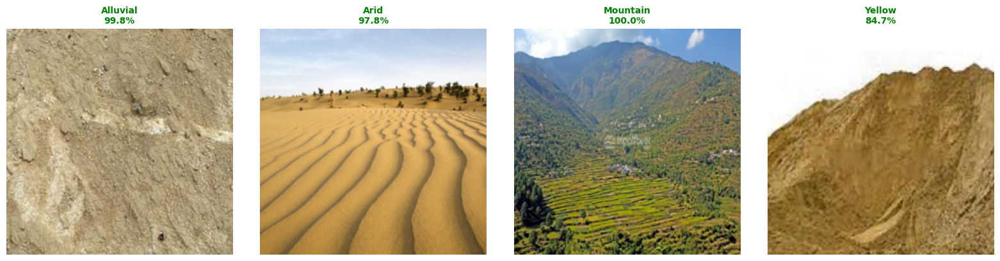

In [53]:
image_paths = [
    '/kaggle/input/comprehensive-soil-classification-datasets/Orignal-Dataset/Alluvial_Soil/105.jpg',
    '/kaggle/input/comprehensive-soil-classification-datasets/Orignal-Dataset/Arid_Soil/103.jpg',
    '/kaggle/input/comprehensive-soil-classification-datasets/Orignal-Dataset/Mountain_Soil/103.jpg',
    '/kaggle/input/comprehensive-soil-classification-datasets/Orignal-Dataset/Yellow_Soil/106.jpg'
]
predict_multiple_images(image_paths, model, class_names)

In [ ]:
def show_sample_predictions(X_test, Y_test, model, class_names, num_samples=20):
    predictions = model.predict(X_test, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    correct = np.sum(predicted_classes == Y_test)
    total = len(Y_test)
    accuracy = (correct / total) * 100
    print(f"Test Set Results:")
    print(f"Total Images: {total}")
    print(f"Correctly Classified: {correct}")
    print(f"Incorrectly Classified: {total - correct}")
    print(f"Accuracy: {accuracy:.2f}%")
    indices = np.random.choice(len(X_test), min(num_samples, len(X_test)), replace=False)
    cols = 5
    rows = (num_samples + cols - 1) // cols
    
    plt.figure(figsize=(20, 4 * rows))
    
    for i, idx in enumerate(indices):
        img = X_test[idx]
        true_label = class_names[Y_test[idx]]
        pred_label = class_names[predicted_classes[idx]]
        confidence = predictions[idx][predicted_classes[idx]] * 100
        
        is_correct = Y_test[idx] == predicted_classes[idx]
        
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img.astype('uint8'))
        plt.axis('off')
        color = 'green' if is_correct else 'red'
        status = '✓' if is_correct else '✗'
        
        title = f'{status} True: {true_label}\nPred: {pred_label}\n{confidence:.1f}%'
        plt.title(title, fontsize=9, fontweight='bold', color=color)
    
    plt.suptitle(f'Sample Predictions - Test Accuracy: {accuracy:.2f}%', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.show()
    
    return accuracy, correct, total

- Test Set Results:
- Total Images: 1020
- Correctly Classified: 986
- Incorrectly Classified: 34
- Accuracy: 96.67%

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step

Test Set Results:
Total Images: 1020
Correctly Classified: 986
Incorrectly Classified: 34
Accuracy: 96.67%



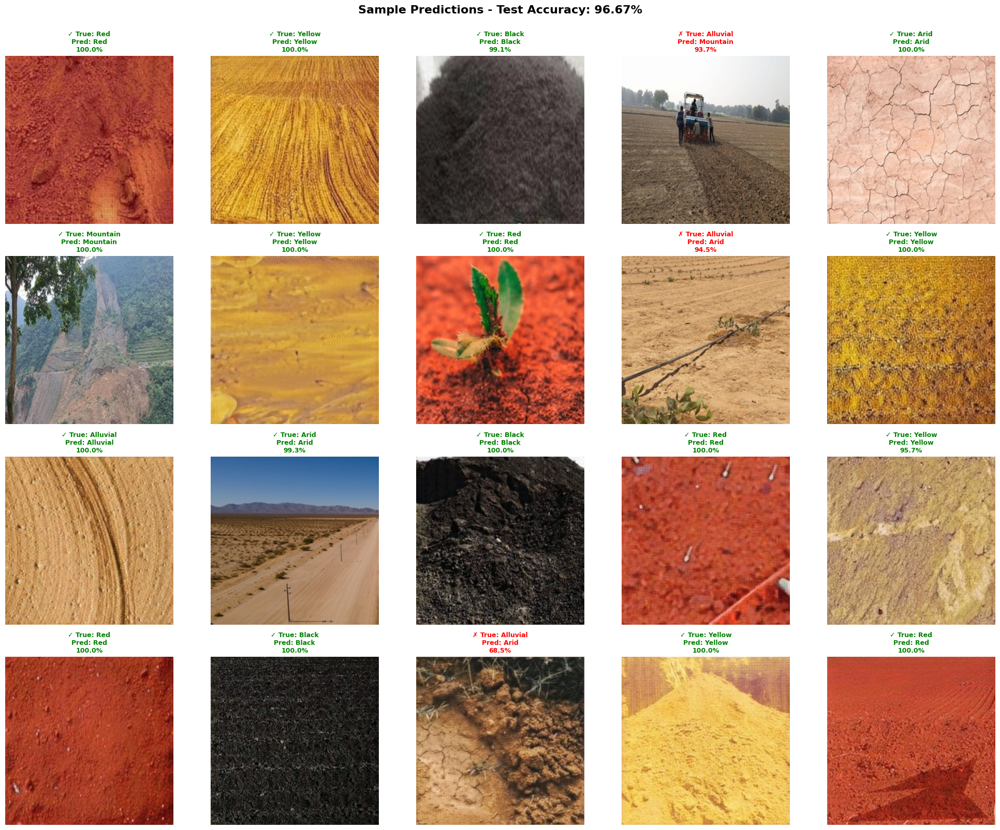

In [55]:
accuracy, correct, total = show_sample_predictions(X_test, Y_test, model, class_names, num_samples=20)

Misclassification Analysis:
- Total Misclassifications: 34

In [ ]:
def analyze_misclassifications(X_test, Y_test, model, class_names):
    predictions = model.predict(X_test, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    misclassified_indices = np.where(predicted_classes != Y_test)[0]
    print(f"Misclassification Analysis:")
    print(f"Total Misclassifications: {len(misclassified_indices)}")
    
    if len(misclassified_indices) == 0:
        print("Perfect classification! No errors found.")
        return
    num_to_show = min(16, len(misclassified_indices))
    
    plt.figure(figsize=(16, 4 * ((num_to_show + 3) // 4)))
    
    for i in range(num_to_show):
        idx = misclassified_indices[i]
        img = X_test[idx]
        true_label = class_names[Y_test[idx]]
        pred_label = class_names[predicted_classes[idx]]
        confidence = predictions[idx][predicted_classes[idx]] * 100
        
        plt.subplot((num_to_show + 3) // 4, 4, i + 1)
        plt.imshow(img.astype('uint8'))
        plt.axis('off')
        plt.title(f'True: {true_label}\nPredicted: {pred_label}\nConf: {confidence:.1f}%',
                 fontsize=9, fontweight='bold', color='red')
    
    plt.suptitle('Misclassified Samples', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step

Misclassification Analysis:
Total Misclassifications: 34



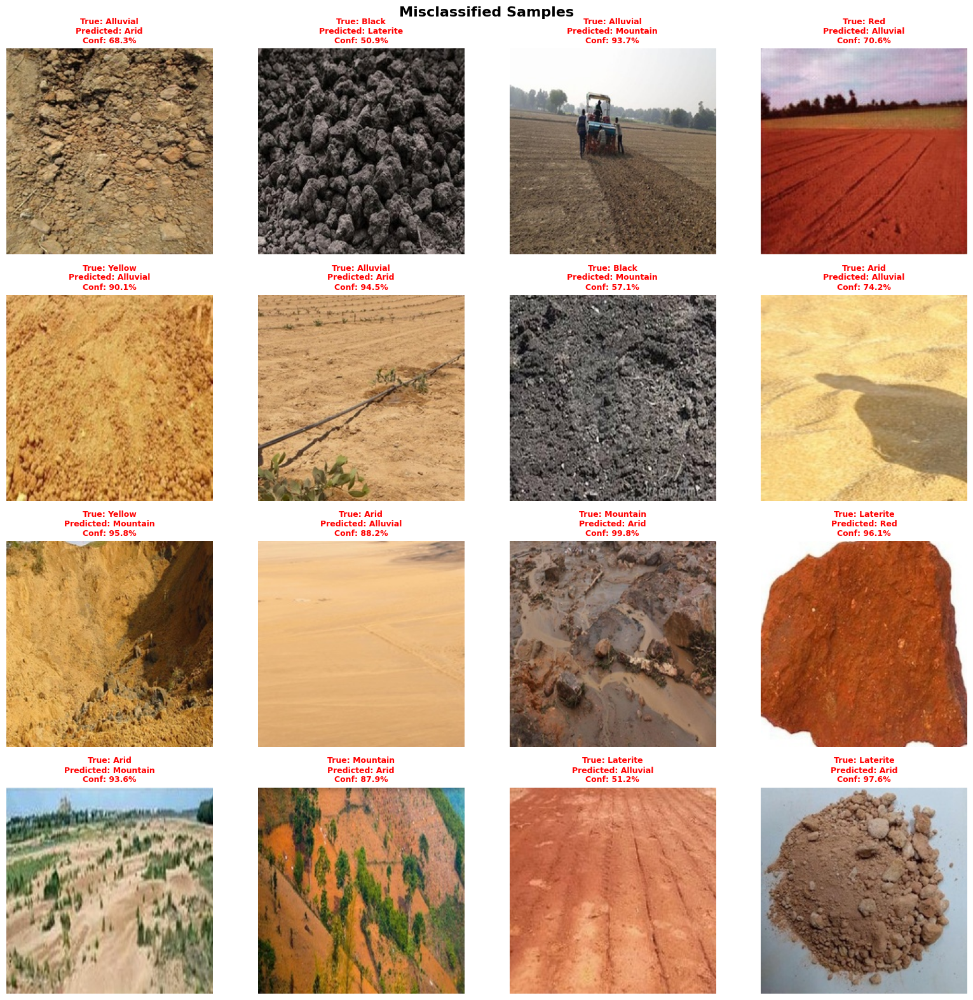

In [57]:
analyze_misclassifications(X_test, Y_test, model, class_names)

Per-Class Accuracy:
============================================================
- Alluvial    : 133/139 =  95.68%
- Laterite    :  40/ 44 =  90.91%
- Black       : 233/235 =  99.15%
- Yellow      : 275/280 =  98.21%
- Arid        :  46/ 57 =  80.70%
- Mountain    :  36/ 40 =  90.00%
- Red         : 223/225 =  99.11%

In [ ]:
def calculate_per_class_accuracy(X_test, Y_test, model, class_names):
    predictions = model.predict(X_test, verbose=1)
    predicted_classes = np.argmax(predictions, axis=1)
    print(f"Per-Class Accuracy:")
    
    accuracies = []
    for i, class_name in enumerate(class_names):
        class_indices = np.where(Y_test == i)[0]
        
        if len(class_indices) > 0:
            correct = np.sum(predicted_classes[class_indices] == i)
            total = len(class_indices)
            accuracy = (correct / total) * 100
            accuracies.append(accuracy)
            print(f"{class_name:12s}: {correct:3d}/{total:3d} = {accuracy:6.2f}%")
        else:
            print(f"{class_name:12s}: No samples in test set")
            accuracies.append(0)
    plt.figure(figsize=(12, 6))
    colors = ['green' if acc > 80 else 'orange' if acc > 60 else 'red' for acc in accuracies]
    bars = plt.bar(class_names, accuracies, color=colors, alpha=0.7, edgecolor='black')
    plt.xlabel('Soil Type', fontsize=12, fontweight='bold')
    plt.ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
    plt.title('Per-Class Accuracy on Test Set', fontsize=14, fontweight='bold')
    plt.ylim(0, 100)
    plt.axhline(y=80, color='g', linestyle='--', alpha=0.5, label='80% threshold')
    plt.grid(axis='y', alpha=0.3)

    for bar, acc in zip(bars, accuracies):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 1,
                f'{acc:.1f}%', ha='center', va='bottom', fontweight='bold')
    
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    return accuracies

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step

Per-Class Accuracy:
Alluvial    : 133/139 =  95.68%
Laterite    :  40/ 44 =  90.91%
Black       : 233/235 =  99.15%
Yellow      : 275/280 =  98.21%
Arid        :  46/ 57 =  80.70%
Mountain    :  36/ 40 =  90.00%
Red         : 223/225 =  99.11%



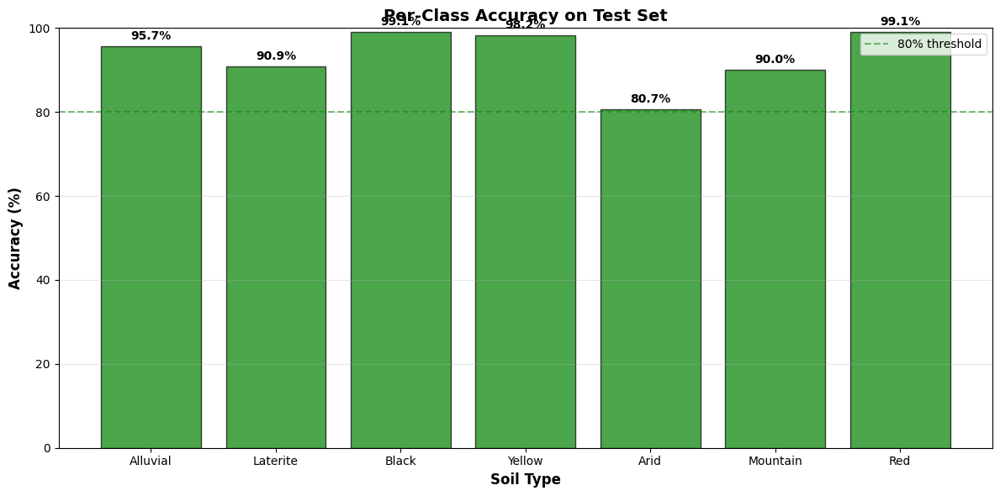

In [59]:
per_class_acc = calculate_per_class_accuracy(X_test, Y_test, model, class_names)